In [1]:
import numpy as np
import matplotlib.pyplot as plt
from astropy.io import fits
from astropy.wcs import WCS
from astropy.coordinates import SkyCoord
import astropy.units as u
import aplpy
import os
from glob import glob
from tqdm import tqdm

In [2]:
def crear_imagen_profesional_paper(campo, output_name=None):
    """
    Crea una imagen de calidad profesional para publicación científica
    """
    base_path = f"../anac_data/{campo}"
    
    # Crear directorio temporal
    temp_dir = f"{base_path}/temp"
    os.makedirs(temp_dir, exist_ok=True)
    
    # Archivos temporales
    temp_r = f"{temp_dir}/{campo}_F861.fits"
    temp_g = f"{temp_dir}/{campo}_F660.fits"
    temp_b = f"{temp_dir}/{campo}_F515.fits"
    rgb_cube = f"{temp_dir}/{campo}_rgb_cube.fits"
    rgb_png = f"{temp_dir}/{campo}_rgb_image.png"
    
    print(f"🖼️  Creando imagen profesional para paper: {campo}")
    
    try:
        # 1. Extraer datos
        print(" - Extrayendo datos...")
        def extraer_hdu_comprimida(archivo_entrada, archivo_salida):
            with fits.open(archivo_entrada) as hdul:
                comp_hdu = hdul[1]
                data = comp_hdu.data
                header = comp_hdu.header
                primary_hdu = fits.PrimaryHDU(data=data, header=header)
                primary_hdu.writeto(archivo_salida, overwrite=True)
        
        extraer_hdu_comprimida(f"{base_path}/{campo}_F861.fits.fz", temp_r)
        extraer_hdu_comprimida(f"{base_path}/{campo}_F660.fits.fz", temp_g)
        extraer_hdu_comprimida(f"{base_path}/{campo}_F515.fits.fz", temp_b)
        
        # 2. Crear cubo RGB
        print(" - Creando cubo RGB profesional...")
        aplpy.make_rgb_cube([temp_r, temp_g, temp_b], rgb_cube)
        
        # 3. Generar imagen con parámetros de alta calidad - CORREGIDO
        print(" - Generando imagen de alta calidad...")
        aplpy.make_rgb_image(
            rgb_cube, rgb_png,
            stretch_r='log', stretch_g='log', stretch_b='log',  # Cambiado de 'asinh' a 'log'
            vmin_r=0.005, vmin_g=0.005, vmin_b=0.005,
            vmax_r=0.99, vmax_g=0.99, vmax_b=0.99
        )
        
        # 4. Crear figura profesional
        print(" - Creando visualización profesional...")
        img = plt.imread(rgb_png)
        
        # Figura con estilo científico profesional
        fig = plt.figure(figsize=(20, 16), facecolor='white')
        
        # Usar GridSpec para control preciso del layout
        gs = plt.GridSpec(2, 2, figure=fig, height_ratios=[0.9, 0.1], 
                         width_ratios=[0.9, 0.1], hspace=0.05, wspace=0.05)
        
        # Ax principal para la imagen
        ax_img = fig.add_subplot(gs[0, 0])
        ax_img.imshow(img)
        ax_img.axis('off')
        
        # Ax para la barra de escala
        ax_scale = fig.add_subplot(gs[1, 0])
        ax_scale.axis('off')
        
        # Ax para la barra de color (opcional)
        ax_color = fig.add_subplot(gs[0, 1])
        ax_color.axis('off')
        
        # Obtener información científica del header
        with fits.open(temp_r) as hdul:
            header = hdul[0].header
            ra = header.get('CRVAL1', 'N/A')
            dec = header.get('CRVAL2', 'N/A')
            filter_r = header.get('FILTER', 'N/A')
            exptime_r = header.get('EXPTIME', 'N/A')
            mjd_obs = header.get('MJD-OBS', 'N/A')
            date_obs = header.get('DATE-OBS', 'N/A')
            telescope = header.get('TELESCOP', 'N/A')
            instrument = header.get('INSTRUME', 'N/A')
        
        # Título científico
        fig.suptitle(f'J-PLUS Observation: {campo}\nCentaurus A Field', 
                    fontsize=24, weight='bold', y=0.95)
        
        # Información científica en el lado derecho
        info_text = f"""Telescope: {telescope}
Instrument: {instrument}
Filters: F861 (i), F660 (r), F515 (g)
Exposure: {exptime_r}s (i), 870s (r), 183s (g)
Observation Date: {date_obs}
MJD: {mjd_obs}
Coordinates:
RA = {ra:.6f}°
DEC = {dec:.6f}°
Pixel Scale: 0.55 arcsec/pixel
Field of View: 1.68° × 1.68°"""

        fig.text(0.72, 0.65, info_text, fontsize=14, 
                verticalalignment='top', family='monospace',
                bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))
        
        # Barra de escala profesional
        scale_arcmin = 10  # 10 arcmin
        scale_pixels = int(scale_arcmin * 60 / 0.55)  # Convertir a pixels
        
        # Dibujar barra de escala
        scale_y = 0.05  # Posición vertical en el ax_scale
        ax_scale.plot([0.1, 0.1 + scale_pixels/img.shape[1]], 
                     [scale_y, scale_y], 
                     color='black', linewidth=8, transform=ax_scale.transAxes)
        
        # Texto de la barra de escala
        ax_scale.text(0.1 + scale_pixels/img.shape[1]/2, scale_y + 0.1, 
                     f'{scale_arcmin} arcmin', 
                     ha='center', va='bottom', fontsize=16, weight='bold',
                     transform=ax_scale.transAxes)
        
        # Norte y Este
        ax_scale.text(0.95, 0.2, 'E', ha='center', va='center', 
                     fontsize=14, weight='bold', transform=ax_scale.transAxes)
        ax_scale.text(0.05, 0.8, 'N', ha='center', va='center', 
                     fontsize=14, weight='bold', transform=ax_img.transAxes)
        
        # Añadir flecha del Norte (simulada)
        ax_img.annotate('', xy=(0.05, 0.85), xytext=(0.05, 0.95),
                       xycoords='axes fraction', 
                       arrowprops=dict(arrowstyle='->', color='black', lw=3))
        
        # Créditos
        fig.text(0.02, 0.02, 
                'J-PLUS DR3 • T80/T80Cam @ OAJ\n'
                'Processing: Python/Astropy/APLpy\n'
                f'Field: {campo} • Filters: F861(i), F660(r), F515(g)',
                fontsize=12, color='gray', ha='left')
        
        if output_name:
            # Guardar en alta resolución para publicación
            plt.savefig(output_name, dpi=600, bbox_inches='tight', 
                       facecolor='white', edgecolor='none',
                       transparent=False)
            
            # También guardar versión para presentación (fondo negro)
            presentation_name = output_name.replace('.png', '_presentation.png')
            
            # Crear versión con fondo negro
            fig_presentation = plt.figure(figsize=(20, 16), facecolor='black')
            gs_presentation = plt.GridSpec(2, 2, figure=fig_presentation, 
                                         height_ratios=[0.9, 0.1], 
                                         width_ratios=[0.9, 0.1], 
                                         hspace=0.05, wspace=0.05)
            
            ax_img_pres = fig_presentation.add_subplot(gs_presentation[0, 0])
            ax_img_pres.imshow(img)
            ax_img_pres.axis('off')
            
            ax_scale_pres = fig_presentation.add_subplot(gs_presentation[1, 0])
            ax_scale_pres.axis('off')
            ax_scale_pres.set_facecolor('black')
            
            ax_color_pres = fig_presentation.add_subplot(gs_presentation[0, 1])
            ax_color_pres.axis('off')
            
            # Título para presentación
            fig_presentation.suptitle(f'J-PLUS Observation: {campo}\nCentaurus A Field', 
                                    fontsize=24, weight='bold', y=0.95, color='white')
            
            # Información para presentación
            fig_presentation.text(0.72, 0.65, info_text, fontsize=14, 
                                verticalalignment='top', family='monospace', color='white',
                                bbox=dict(boxstyle='round', facecolor='black', alpha=0.8))
            
            # Barra de escala para presentación
            ax_scale_pres.plot([0.1, 0.1 + scale_pixels/img.shape[1]], 
                             [scale_y, scale_y], 
                             color='white', linewidth=8, transform=ax_scale_pres.transAxes)
            
            ax_scale_pres.text(0.1 + scale_pixels/img.shape[1]/2, scale_y + 0.1, 
                             f'{scale_arcmin} arcmin', 
                             ha='center', va='bottom', fontsize=16, weight='bold', color='white',
                             transform=ax_scale_pres.transAxes)
            
            # Norte y Este para presentación
            ax_scale_pres.text(0.95, 0.2, 'E', ha='center', va='center', 
                             fontsize=14, weight='bold', color='white', transform=ax_scale_pres.transAxes)
            ax_img_pres.text(0.05, 0.8, 'N', ha='center', va='center', 
                           fontsize=14, weight='bold', color='white', transform=ax_img_pres.transAxes)
            
            # Flecha del Norte para presentación
            ax_img_pres.annotate('', xy=(0.05, 0.85), xytext=(0.05, 0.95),
                               xycoords='axes fraction', 
                               arrowprops=dict(arrowstyle='->', color='white', lw=3))
            
            # Créditos para presentación
            fig_presentation.text(0.02, 0.02, 
                                'J-PLUS DR3 • T80/T80Cam @ OAJ\n'
                                'Processing: Python/Astropy/APLpy\n'
                                f'Field: {campo} • Filters: F861(i), F660(r), F515(g)',
                                fontsize=12, color='lightgray', ha='left')
            
            plt.savefig(presentation_name, dpi=600, bbox_inches='tight', 
                       facecolor='black', edgecolor='none')
            plt.close(fig_presentation)
            
            print(f"✅ Imagen profesional guardada: {output_name}")
            print(f"✅ Versión presentación guardada: {presentation_name}")
        
        plt.show()
        
        # Limpiar temporales
        for temp_file in [temp_r, temp_g, temp_b, rgb_cube, rgb_png]:
            if os.path.exists(temp_file):
                os.remove(temp_file)
        
        return fig
        
    except Exception as e:
        print(f"❌ Error: {e}")
        import traceback
        traceback.print_exc()
        
        # Limpiar temporales incluso si hay error
        for temp_file in [temp_r, temp_g, temp_b, rgb_cube, rgb_png]:
            if os.path.exists(temp_file):
                try:
                    os.remove(temp_file)
                except:
                    pass
        return None


In [3]:
# Crear imagen profesional para CenA01
#imagen_profesional = crear_imagen_profesional_paper(
#    'CenA01', 
#    '../anac_data/Figs-images/CenA01_profesional_paper.png'
#)


## Profesional mosaic

## Mosaico

In [4]:
def crear_mosaico_profesional_paper():
    """
    Crea un mosaico profesional para publicación científica - VERSIÓN CORREGIDA
    """
    print("🎨 Creando mosaico profesional para paper...")
    
    campos = [f'CenA{i:02d}' for i in range(1, 25)]
    
    # Crear directorio de salida si no existe
    os.makedirs('../anac_data/Figs-images', exist_ok=True)
    
    # Procesar solo los primeros 6 campos para el ejemplo
    campos_muestra = campos[:6]
    
    # Crear figura profesional
    fig = plt.figure(figsize=(25, 18), facecolor='white')
    
    # Grid 2x3 para 6 campos
    gs = plt.GridSpec(2, 3, figure=fig, hspace=0.15, wspace=0.1)
    
    for i, campo in enumerate(tqdm(campos_muestra, desc="Procesando campos")):
        try:
            # Procesar cada campo individualmente
            base_path = f"../anac_data/{campo}"
            temp_dir = f"{base_path}/temp"
            os.makedirs(temp_dir, exist_ok=True)
            
            # Extraer datos
            temp_r = f"{temp_dir}/{campo}_F861.fits"
            temp_g = f"{temp_dir}/{campo}_F660.fits"
            temp_b = f"{temp_dir}/{campo}_F515.fits"
            rgb_cube = f"{temp_dir}/{campo}_rgb_cube.fits"
            rgb_png = f"{temp_dir}/{campo}_rgb_image.png"
            
            def extraer_hdu(archivo_in, archivo_out):
                with fits.open(archivo_in) as hdul:
                    data = hdul[1].data
                    header = hdul[1].header
                    fits.writeto(archivo_out, data, header, overwrite=True)
            
            extraer_hdu(f"{base_path}/{campo}_F861.fits.fz", temp_r)
            extraer_hdu(f"{base_path}/{campo}_F660.fits.fz", temp_g)
            extraer_hdu(f"{base_path}/{campo}_F515.fits.fz", temp_b)
            
            # Crear RGB - CORREGIDO: usar 'log' en lugar de 'asinh'
            aplpy.make_rgb_cube([temp_r, temp_g, temp_b], rgb_cube)
            aplpy.make_rgb_image(rgb_cube, rgb_png,
                               stretch_r='log', stretch_g='log', stretch_b='log',  # CAMBIADO
                               vmin_r=0.005, vmin_g=0.005, vmin_b=0.005,
                               vmax_r=0.99, vmax_g=0.99, vmax_b=0.99)
            
            # Añadir al mosaico
            ax = fig.add_subplot(gs[i//3, i%3])
            img = plt.imread(rgb_png)
            ax.imshow(img)
            ax.set_title(campo, fontsize=16, weight='bold', pad=10)
            ax.axis('off')
            
            # Limpiar temporales
            for temp_file in [temp_r, temp_g, temp_b, rgb_cube, rgb_png]:
                if os.path.exists(temp_file):
                    os.remove(temp_file)
                    
        except Exception as e:
            print(f"❌ Error con {campo}: {e}")
            # Crear un subplot vacío con mensaje de error
            ax = fig.add_subplot(gs[i//3, i%3])
            ax.text(0.5, 0.5, f'{campo}\nError', ha='center', va='center', 
                   transform=ax.transAxes, fontsize=12)
            ax.set_facecolor('lightcoral')
            ax.axis('off')
            continue
    
    # Título y metadatos del mosaico
    fig.suptitle('J-PLUS Survey: Centaurus A Mosaic\n'
                'False-color RGB: F861 (i-band) → Red, F660 (r-band) → Green, F515 (g-band) → Blue', 
                fontsize=24, weight='bold', y=0.98)
    
    # Información del survey
    survey_info = """J-PLUS (Javalambre Physics of the Accelerating Universe Astrophysical Survey)
Telescope: T80 @ OAJ, Spain • Instrument: T80Cam • Pixel Scale: 0.55"/pixel
Field Size: 2°×2° per pointing • Total Coverage: ~48 deg²
Data Release: J-PLUS DR3 • Processing: Python/Astropy/APLpy"""
    
    fig.text(0.02, 0.02, survey_info, fontsize=12, 
            verticalalignment='bottom', family='monospace',
            bbox=dict(boxstyle='round', facecolor='lightgray', alpha=0.8))
    
    # Guardar mosaico profesional
    output_path = '../anac_data/Figs-images/mosaico_profesional_paper.png'
    plt.savefig(output_path, dpi=300, bbox_inches='tight',  # Reducido a 300 DPI para mayor velocidad
               facecolor='white', edgecolor='none')
    
    print(f"✅ Mosaico profesional guardado: {output_path}")
    plt.show()
    
    return fig

🎨 Creando mosaico profesional para paper...


Procesando campos:   0%|                                                                                                                                          | 0/6 [00:00<?, ?it/s]WARNING: FITSFixedWarning: 'datfix' made the change 'Set DATE-OBS to '2023-03-26T08:03:37.585' from MJD-OBS'. [astropy.wcs.wcs]


INFO: Red: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


INFO: Green: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]
INFO: Blue: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


Procesando campos:  17%|█████████████████████▌                                                                                                           | 1/6 [02:54<14:30, 174.12s/it]WARNING: FITSFixedWarning: 'datfix' made the change 'Set DATE-OBS to '2023-03-26T07:03:32.571' from MJD-OBS'. [astropy.wcs.wcs]


INFO: Red: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


INFO: Green: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]
INFO: Blue: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


Procesando campos:  33%|███████████████████████████████████████████                                                                                      | 2/6 [05:48<11:37, 174.49s/it]WARNING: FITSFixedWarning: 'datfix' made the change 'Set DATE-OBS to '2023-03-26T09:03:31.611' from MJD-OBS'. [astropy.wcs.wcs]


INFO: Red: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


INFO: Green: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]
INFO: Blue: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


Procesando campos:  50%|████████████████████████████████████████████████████████████████▌                                                                | 3/6 [08:43<08:43, 174.60s/it]WARNING: FITSFixedWarning: 'datfix' made the change 'Set DATE-OBS to '2023-03-26T02:36:49.539' from MJD-OBS'. [astropy.wcs.wcs]


INFO: Red: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


INFO: Green: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]
INFO: Blue: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


Procesando campos:  67%|██████████████████████████████████████████████████████████████████████████████████████                                           | 4/6 [11:38<05:49, 174.70s/it]WARNING: FITSFixedWarning: 'datfix' made the change 'Set DATE-OBS to '2023-04-02T07:29:21.325' from MJD-OBS'. [astropy.wcs.wcs]


INFO: Red: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


INFO: Green: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]
INFO: Blue: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


Procesando campos:  83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████▌                     | 5/6 [14:33<02:54, 174.83s/it]WARNING: FITSFixedWarning: 'datfix' made the change 'Set DATE-OBS to '2023-04-02T06:29:18.342' from MJD-OBS'. [astropy.wcs.wcs]


INFO: Red: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


INFO: Green: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]
INFO: Blue: [aplpy.rgb]
INFO: vmin =  5.000e-03 [aplpy.rgb]
INFO: vmax =  9.900e-01 [aplpy.rgb]


Procesando campos: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [17:28<00:00, 174.76s/it]


✅ Mosaico profesional guardado: ../anac_data/Figs-images/mosaico_profesional_paper.png


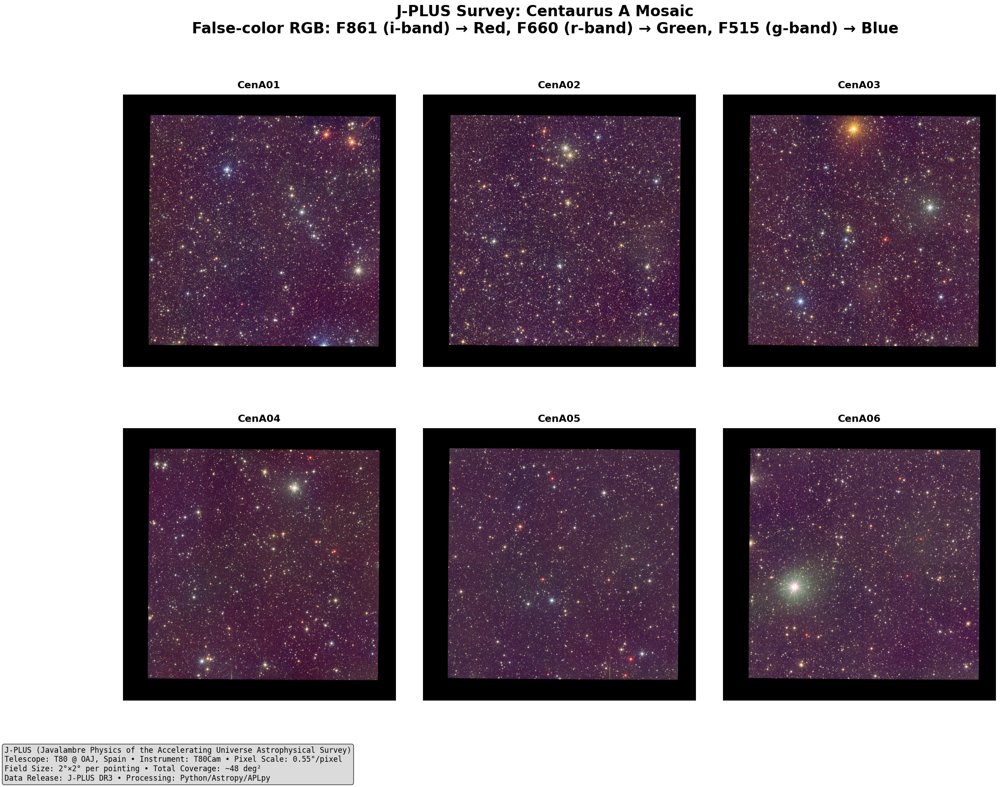

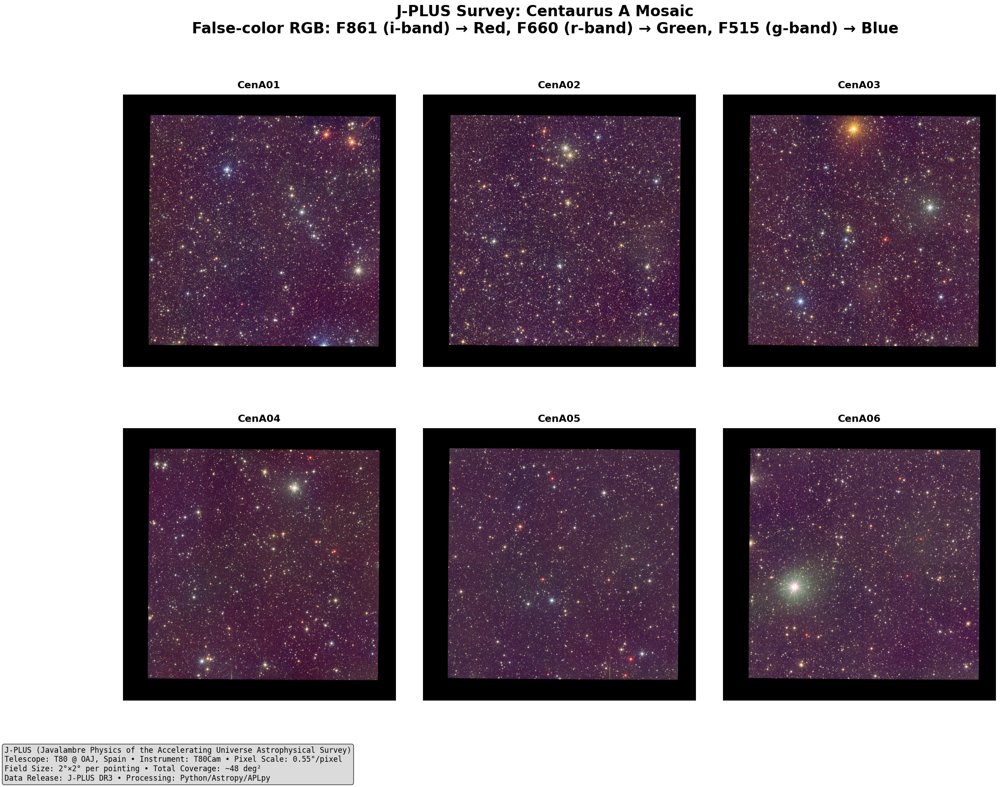

In [5]:
crear_mosaico_profesional_paper()

## Optimizado 

Use

In [7]:
def crear_mosaico_rapido_optimizado():
    """
    Versión optimizada que procesa más rápido usando subregiones
    """
    print("⚡ Creando mosaico rápido optimizado...")
    
    campos = [f'CenA{i:02d}' for i in range(1, 7)]  # Solo 6 campos
    
    # Crear figura
    fig, axes = plt.subplots(2, 3, figsize=(20, 14))
    axes = axes.flatten()
    
    for i, campo in enumerate(tqdm(campos, desc="Procesando campos")):
        try:
            base_path = f"../anac_data/{campo}"
            temp_dir = f"{base_path}/temp_mosaico"
            os.makedirs(temp_dir, exist_ok=True)
            
            # Extraer solo una subregión central para mayor velocidad (2000x2000 píxeles)
            def extraer_subregion(archivo_fz, archivo_out, size=2000):
                with fits.open(archivo_fz) as hdul:
                    data_full = hdul[1].data
                    header = hdul[1].header
                    
                    # Tomar centro de la imagen
                    center_y, center_x = data_full.shape[0]//2, data_full.shape[1]//2
                    half_size = size // 2
                    
                    # Extraer subregión central
                    sub_data = data_full[center_y-half_size:center_y+half_size, 
                                       center_x-half_size:center_x+half_size]
                    
                    # Actualizar header para la subregión
                    header['CRPIX1'] = header['CRPIX1'] - (center_x - half_size)
                    header['CRPIX2'] = header['CRPIX2'] - (center_y - half_size)
                    header['NAXIS1'] = size
                    header['NAXIS2'] = size
                    
                    fits.writeto(archivo_out, sub_data, header, overwrite=True)
            
            temp_r = f"{temp_dir}/{campo}_F861_sub.fits"
            temp_g = f"{temp_dir}/{campo}_F660_sub.fits" 
            temp_b = f"{temp_dir}/{campo}_F515_sub.fits"
            rgb_cube = f"{temp_dir}/{campo}_rgb_cube.fits"
            rgb_png = f"{temp_dir}/{campo}_rgb_image.png"
            
            # Extraer subregiones
            extraer_subregion(f"{base_path}/{campo}_F861.fits.fz", temp_r)
            extraer_subregion(f"{base_path}/{campo}_F660.fits.fz", temp_g)
            extraer_subregion(f"{base_path}/{campo}_F515.fits.fz", temp_b)
            
            # Crear RGB
            aplpy.make_rgb_cube([temp_r, temp_g, temp_b], rgb_cube)
            aplpy.make_rgb_image(rgb_cube, rgb_png,
                               stretch_r='log', stretch_g='log', stretch_b='log',
                               vmin_r=0.01, vmin_g=0.01, vmin_b=0.01,
                               vmax_r=0.95, vmax_g=0.95, vmax_b=0.95)
            
            # Añadir al mosaico
            img = plt.imread(rgb_png)
            axes[i].imshow(img)
            axes[i].set_title(campo, fontsize=14, weight='bold', pad=10)
            axes[i].axis('off')
            
            # Limpiar temporales inmediatamente
            for temp_file in [temp_r, temp_g, temp_b, rgb_cube, rgb_png]:
                if os.path.exists(temp_file):
                    os.remove(temp_file)
            
            # Intentar limpiar el directorio temporal
            try:
                os.rmdir(temp_dir)
            except:
                pass
                
        except Exception as e:
            print(f"❌ Error con {campo}: {e}")
            axes[i].text(0.5, 0.5, f'{campo}\nError', ha='center', va='center', 
                       transform=axes[i].transAxes, fontsize=10)
            axes[i].set_facecolor('lightcoral')
            axes[i].axis('off')
            continue
    
    # Ocultar ejes vacíos si hay menos de 6 campos
    for i in range(len(campos), len(axes)):
        axes[i].axis('off')
    
    plt.suptitle('J-PLUS Survey: Centaurus A Mosaic (Subregiones Centrales)\n'
                'RGB: F861(i) → Red, F660(r) → Green, F515(g) → Blue', 
                fontsize=20, weight='bold', y=0.95)
    
    plt.tight_layout()
    output_path = '../anac_data/Figs-images/mosaico_rapido_optimizado.png'
    plt.savefig(output_path, dpi=200, bbox_inches='tight', facecolor='white')
    print(f"✅ Mosaico rápido guardado: {output_path}")
    plt.show()
    
    return fig

## Using preprosesing images

In [ ]:
def crear_mosaico_desde_imagenes_existentes():
    """
    Crea un mosaico a partir de imágenes RGB ya procesadas
    """
    print("🖼️  Creando mosaico desde imágenes existentes...")
    
    # Buscar todas las imágenes RGB existentes
    patrones = ['../anac_data/Figs-images/CenA*_rgb_final.png',
                '../anac_data/Figs-images/CenA*_profesional_paper.png',
                'CenA*_rgb_final.png',
                'CenA*_profesional_paper.png']
    
    imagenes = []
    for patron in patrones:
        imagenes.extend(glob.glob(patron))
    
    # Eliminar duplicados y ordenar
    imagenes = list(set(imagenes))
    imagenes.sort()
    
    print(f"📁 Encontradas {len(imagenes)} imágenes:")
    for img in imagenes:
        print(f"   - {os.path.basename(img)}")
    
    if not imagenes:
        print("❌ No se encontraron imágenes RGB. Procesa algunos campos primero.")
        return None
    
    # Crear mosaico
    n_imagenes = len(imagenes)
    if n_imagenes <= 4:
        filas, cols = 2, 2
    elif n_imagenes <= 6:
        filas, cols = 2, 3
    elif n_imagenes <= 9:
        filas, cols = 3, 3
    elif n_imagenes <= 12:
        filas, cols = 3, 4
    elif n_imagenes <= 16:
        filas, cols = 4, 4
    else:
        filas, cols = 4, 6
    
    fig, axes = plt.subplots(filas, cols, figsize=(cols*4, filas*3))
    if filas == 1 and cols == 1:
        axes = np.array([axes])
    axes = axes.flatten()
    
    for i, img_path in enumerate(imagenes):
        if i < len(axes):
            img = plt.imread(img_path)
            axes[i].imshow(img)
            nombre = os.path.basename(img_path).replace('_rgb_final.png', '').replace('_profesional_paper.png', '')
            axes[i].set_title(nombre, fontsize=10, weight='bold', pad=5)
            axes[i].axis('off')
    
    # Ocultar ejes sobrantes
    for i in range(len(imagenes), len(axes)):
        axes[i].axis('off')
    
    plt.suptitle(f'J-PLUS Centaurus A Mosaic - {n_imagenes} Fields\n'
                'RGB Composition: F861(i) → Red, F660(r) → Green, F515(g) → Blue',
                fontsize=16, weight='bold', y=0.98)
    
    plt.tight_layout()
    output_path = '../anac_data/Figs-images/mosaico_desde_existentes.png'
    plt.savefig(output_path, dpi=200, bbox_inches='tight', facecolor='white')
    print(f"✅ Mosaico desde existentes guardado: {output_path}")
    plt.show()
    
    return fig